## A demo of some interesting findings by the comparisons of Landsat 8 (L8) TOA and surface reflectance

In the comparisons of L8 surface reflectance and TOA reflectance, we have found that the L8 atmospheric correction may have some wrong application of dark dense vegetation (DDV) method ([Kaufman et al., 1997](http://modis-atmos.gsfc.nasa.gov/new_reference/data/papers/Kaufman_et_al_B.1997.pdf); [Remer et al., 2005](http://journals.ametsoc.org/doi/abs/10.1175/JAS3385.1)). Since it is [***"based on the physical correlation between chlorophyll absorption and bound water absorptionn, a linear relation between shortwave-infrared (2.2 μm) and surface reflectance (nearly unaffected by the atmosphere) and surface reflectance in the visible bands"***](https://dwrgis.water.ca.gov/documents/269784/4654504/LEDAPS+Surface+Reflectance+Product+Description.pdf) is used for the retrival of AOT. The retrived AOT value is inverted at [40$\times$40 pixels](https://pubs.usgs.gov/of/2013/1057/ofr13_1057.pdf) resolution(1.2km$\times$1.2km) and the 'unpysical' values, such as water shoud have been rejected. 

Fowllowing 3 examples are used to simply demostrate some findings, i.e. three tiles over China, UK and France.

### 1. China

In [1]:
import gdal
import numpy as np
from scipy.stats import linregress
from sklearn import linear_model
from scipy.stats import linregress
import pylab as plt
from scipy import optimize
%matplotlib inline

Open one image tile, read in a 1000$\times$1000 small pathch and apply the scale factor to obtain the surface reflectance and TOA reflectance.

In [2]:
sr_b2 = gdal.Open('data/LC81220342016070LGN00_sr_band2.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001
toa_b2 = gdal.Open('data/LC81220342016070LGN00_toa_band2.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001

since the [Ozone](https://dwrgis.water.ca.gov/documents/269784/4654504/LEDAPS+Surface+Reflectance+Product+Description.pdf) and [Water vapour](https://dwrgis.water.ca.gov/documents/269784/4654504/LEDAPS+Surface+Reflectance+Product+Description.pdf) values are at 1.25$\times$1.00 degrees and 2.5$\times$2.5 degrees resolution, respectively, over this small patch these two values should be almost constant. Then the major effects should come from variation of AOT over the scene.

We simply plot the surface reflectance against the TOA reflectance at band 2 (blue), which directly show the effects of atmospheric effects (or AOT) on the reflectance values.

(0, 0.3)

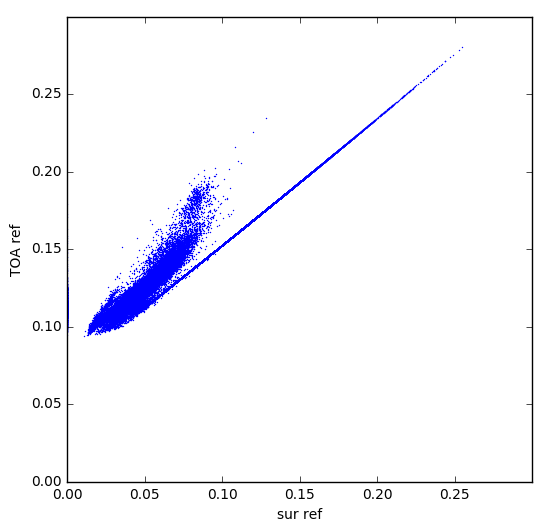

In [3]:
plt.figure(figsize=(6,6))
plt.plot(sr_b2.ravel(), toa_b2.ravel(), 'o', mew=0, ms=1)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

For TOA reflectance values smaller than 0.2, the relationship between the surface reflectance and the TOA reflectance is very scattered, which indicates that the AOT vlaue varies a lot over this patch, especially for objects with low reflectance values. However, away from the scattered points there is a linear relationship exists between the surface relfectance and the TOA reflectance, which indicates that the AOT vlaues for those pixels are almost the same. To separate them, ransac method is used with simple linear regression.

In [4]:
# ransac with linear regression model
def ransaclin(x,y):
    y, x = y.reshape((len(y),1)), x.reshape((len(x),1))
    model = linear_model.LinearRegression()
    model.fit(x, y)

    model_ransac = linear_model.RANSACRegressor(linear_model.LinearRegression(),max_trials=10000000)
    model_ransac.fit(x, y)
    inlier_mask = model_ransac.inlier_mask_
    return x[inlier_mask], y[inlier_mask], inlier_mask

In [12]:
sr_in, toa_in, in_mask = ransaclin(sr_b2.ravel(), toa_b2.ravel())#get the values as well as the mask

Some pixels on above plot with surface reflectance equal to zero while most of the TOA reflectance values are over 0.1, located close to the y axis. They are simply separated by set a small surface reflectance value as threshold.

In [13]:
zeros = (sr_b2.ravel()<0.01)
out_mask = (~in_mask) & (~zeros)

(0, 0.3)

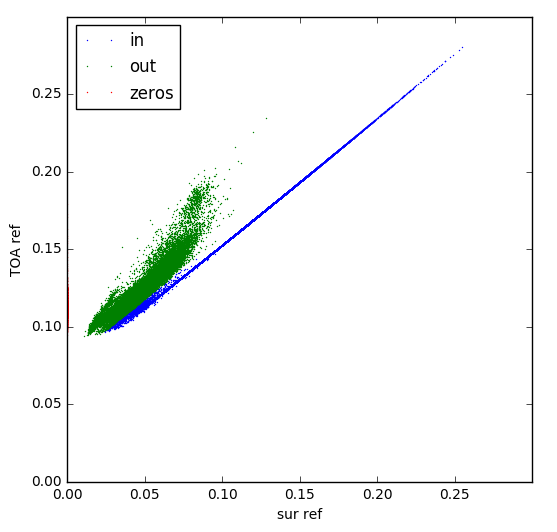

In [14]:
plt.figure(figsize=(6,6))
plt.plot(sr_b2.ravel()[in_mask], toa_b2.ravel()[in_mask], 'o', mew=0, ms=1, label='in')
plt.plot(sr_b2.ravel()[out_mask], toa_b2.ravel()[out_mask], 'o', mew=0, ms=1, label='out')
plt.plot(sr_b2.ravel()[zeros], toa_b2.ravel()[zeros], 'o', mew=0, ms=1, label='zeros')
plt.legend(loc = 'best')
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

Split them into 3 groups, where *in* stands for inliers, *out* stands for outliers and *zeros* stands for the surface reflectance is almost equal to zero.

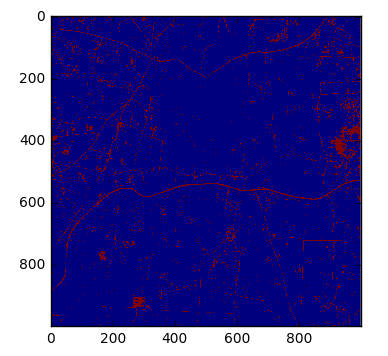

In [15]:
plt.imshow(out_mask.reshape(1000, 1000), interpolation='None') # plot the ouliers mask

It is interesting to notice that the outliers are located in the road, river, urban and lake area, which might indicate that the DDV method is also used in those pixels (Non-vegetation) for the inversion of AOT values. 

In [16]:
# to compose a rgb image check the locations
toa_rgb = [gdal.Open('data/LC81220342016070LGN00_toa_band%d.tif'%band).ReadAsArray(2000, 2000, 1000, 1000)*0.0001 for band in [4,3,2]]
sur_rgb = [gdal.Open('data/LC81220342016070LGN00_sr_band%d.tif'%band).ReadAsArray(2000, 2000, 1000, 1000)*0.0001 for band in [4,3,2]]

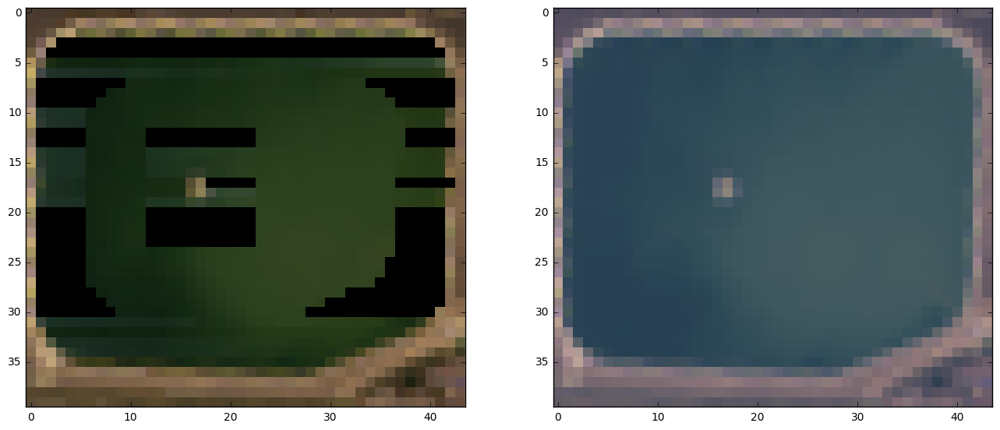

In [17]:
# an illustration of zeros values in surface reflectance over a lake or a pond...
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow((np.array(sur_rgb)[:,900:940, 260:304]).transpose(1,2,0)*3, interpolation='None')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow((np.array(toa_rgb)[:,900:940, 260:304]).transpose(1,2,0)*3, interpolation='None')

Above is an example of surface reflectance with values equals zeros, and those value shoud be considered as errors in the atmospheric correction processes. It also seems that the AOT vlaues change a lot even over this 40$\times$40 pixels area.

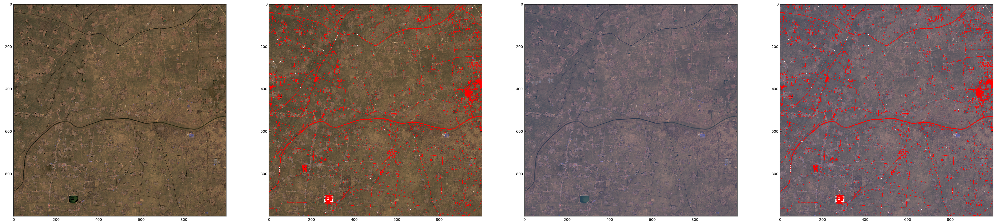

In [18]:
sur = np.array(sur_rgb).transpose(1,2,0)
toa = np.array(toa_rgb).transpose(1,2,0)
temp = sur.copy()
temp[(out_mask).reshape((1000,1000)),1:]=0 # use red to show those pixels
temp[(out_mask).reshape((1000,1000)),0]=1 # with outliers values
temp[(zeros).reshape((1000,1000)),:]=1 # show zeros surface reflectance pixels
temp1 = toa.copy()
temp1[(out_mask).reshape((1000,1000)),1:]=0
temp1[(out_mask).reshape((1000,1000)),0]=1
temp1[(zeros).reshape((1000,1000)),:]=1


fig = plt.figure(figsize=(48,12))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(sur*3, interpolation='None')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(temp*3, interpolation='None')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(toa*3, interpolation='None')
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(temp1*3, interpolation='None')

In [230]:
!convert -delay 100 -loop 0 ch*.pdf ch_comp.gif # generate a gif to make it easier to see the changes

<img src="ch_comp.gif">

From the small test on a patch in China, the DDV method used for L8 atmospheric correction picks those pixels, non-vegetation targets, for the inversion of AOT values. It seems that within a windows of 40 $\times$40 the AOT vlaue can still value a lot, which is against what specified in the LEDAPS algorithm. However, the majority of the AOT values over a 1000$\times$1000 area are almost constant, which is realistic confired by Anderson et al., [(2003)](http://journals.ametsoc.org/doi/pdf/10.1175/1520-0469%282003%29060%3C0119%3AMVOTA%3E2.0.CO%3B2), showing that the spatial correlation of AOT vlaue is higher than 0.9 when the distance from the center is less than 46 km.

### 2. UK

(0, 0.6)

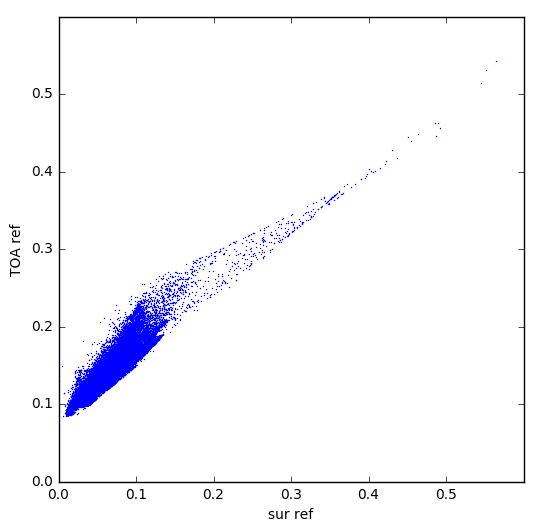

In [19]:
plt.figure(figsize=(6,6))
uk_sr_b2 = gdal.Open('data/LC82010232016111LGN00_sr_band2.tif').ReadAsArray(600, 4800, 1000, 1000)*0.0001
uk_toa_b2 = gdal.Open('data/LC82010232016111LGN00_toa_band2.tif').ReadAsArray(600, 4800, 1000, 1000)*0.0001
plt.plot(uk_sr_b2.ravel(), uk_toa_b2.ravel(), 'o', mew=0, ms=1)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.6)
plt.ylim(0,0.6)

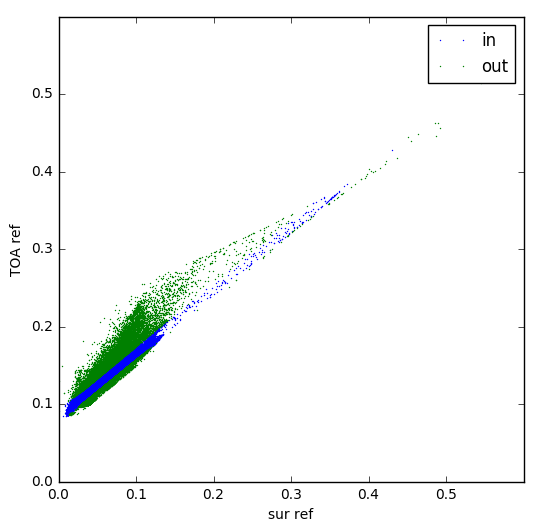

In [21]:
sr_in, toa_in, in_mask = ransaclin(uk_sr_b2.ravel(), uk_toa_b2.ravel())
plt.figure(figsize=(6,6))
plt.plot(uk_sr_b2.ravel()[in_mask ], uk_toa_b2.ravel()[in_mask ], 'o', mew=0, ms=1, label='in')
plt.plot(uk_sr_b2.ravel()[~in_mask], uk_toa_b2.ravel()[~in_mask], 'o', mew=0, ms=1, label='out')
plt.xlim(0,0.6)
plt.ylim(0,0.6)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.legend()

In [22]:
toa_rgb = [gdal.Open('data/LC82010232016111LGN00_toa_band%d.tif'%band).ReadAsArray(600, 4800, 1000, 1000)*0.0001 for band in [4,3,2]]
sur_rgb = [gdal.Open('data/LC82010232016111LGN00_sr_band%d.tif'%band).ReadAsArray(600, 4800, 1000, 1000)*0.0001 for band in [4,3,2]]

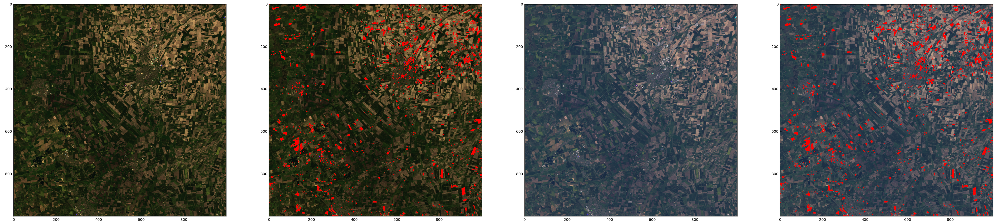

In [23]:
sur = np.array(sur_rgb).transpose(1,2,0)
toa = np.array(toa_rgb).transpose(1,2,0)
temp = sur.copy()
temp[(~in_mask).reshape((1000,1000)),1:]=0
temp[(~in_mask).reshape((1000,1000)),0]=1
temp1 = toa.copy()
temp1[(~in_mask).reshape((1000,1000)),1:]=0
temp1[(~in_mask).reshape((1000,1000)),0]=1


fig = plt.figure(figsize=(48,12))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(sur*3, interpolation='None')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(temp*3, interpolation='None')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(toa*3, interpolation='None')
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(temp1*3, interpolation='None')

In [170]:
(~in_mask).sum()/(1000*1000.) # proportion of outliers

0.033656999999999999

In [176]:
!convert -delay 100 -loop 0 uk*.pdf uk_comp.gif

<img src="uk_comp.gif">

Similar results to what showed in the China example, while it shows that for some areas with lighter green vagetation show a different correction results from the majority o the whole image, which might indicate that the linear relation between visible and SWIR may varys with different vegetation types.

### 3. France

To make it easier to illustrate, a field of 500$\times$500 pixels area in France is used instead of 1000$\times$1000 pixels as ouside areas are mainly non-vegetation land covers.

(0, 0.3)

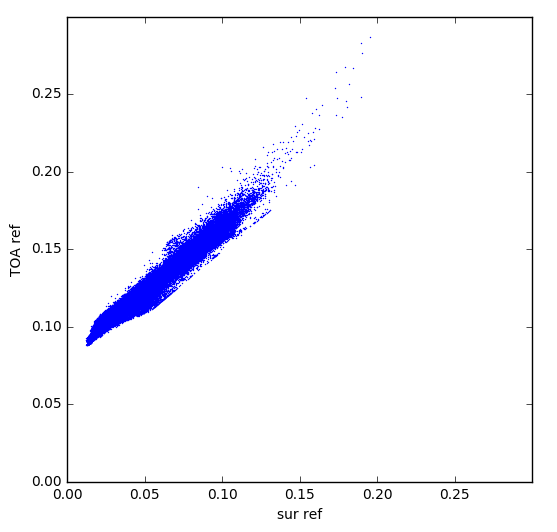

In [24]:
plt.figure(figsize=(6,6))
a,b = 4000, 5000
fr_sr_b2 = gdal.Open('data/LC82020342016246LGN00_sr_band2.tif').ReadAsArray(a,b, 500, 500)*0.0001
fr_toa_b2 = gdal.Open('data/LC82020342016246LGN00_toa_band2.tif').ReadAsArray(a,b, 500, 500)*0.0001
plt.plot(fr_sr_b2.ravel(), fr_toa_b2.ravel(), 'o', mew=0, ms=1)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

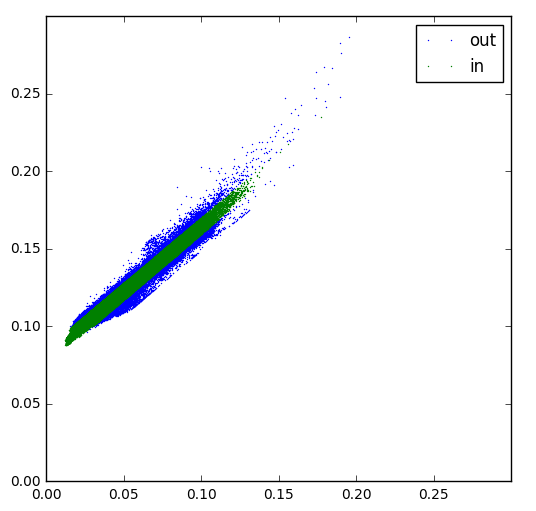

In [28]:
sr_in, toa_in, in_mask = ransaclin(fr_sr_b2.ravel(), fr_toa_b2.ravel())
plt.figure(figsize=(6,6))
plt.plot(fr_sr_b2.ravel()[~in_mask], fr_toa_b2.ravel()[~in_mask], 'o', mew=0, ms=1, label='out')
plt.plot(fr_sr_b2.ravel()[in_mask ], fr_toa_b2.ravel()[in_mask ], 'o', mew=0, ms=1, label='in')
plt.xlim(0,0.3)
plt.ylim(0,0.3)
plt.legend()

In [26]:
toa_rgb = [gdal.Open('data/LC82020342016246LGN00_toa_band%d.tif'%band).ReadAsArray(4000, 5000, 500, 500)*0.0001 for band in [4,3,2]]
sur_rgb = [gdal.Open('data/LC82020342016246LGN00_sr_band%d.tif'%band).ReadAsArray(4000, 5000, 500, 500)*0.0001 for band in [4,3,2]]

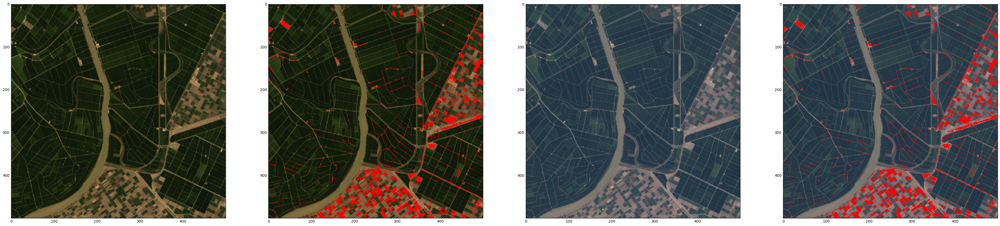

In [27]:
sur = np.array(sur_rgb).transpose(1,2,0)
toa = np.array(toa_rgb).transpose(1,2,0)
temp = sur.copy()
temp[(~in_mask).reshape((500,500)),1:]=0
temp[(~in_mask).reshape((500,500)),0]=1
temp1 = toa.copy()
temp1[(~in_mask).reshape((500,500)),1:]=0
temp1[(~in_mask).reshape((500,500)),0]=1


fig = plt.figure(figsize=(48,12))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(sur*3, interpolation='None')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(temp*3, interpolation='None')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(toa*3, interpolation='None')
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(temp1*3, interpolation='None')

In [341]:
!convert -delay 100 -loop 0 fr*.pdf fr_comp.gif

<img src="fr_comp.gif">

In [343]:
in_mask.sum()/(500.*500)

0.90367200000000003

Again the non-vegetation land covers account for a large proportion of outliers from a simple ransac linear regression, and different vegetation types also seems to give different AOT due a different linear relationship between the SWIR and visible band, which might need to be further improved by other methods or specify different linear relation based on the vegetation types....

From the above results, the major problem in the L8 atmospheric correction method is the contamination from non-vegetation targets, which doese not necessary hold a linear relationship between the visible and SWIR bands. Also, it seems different vegetation types can possible have different linear relationship between these bands. A way to imropve this is to produce a coarser resolution AOT map, since the AOT is likely to be stable over several kms [(Anderson et al., 2003)](http://journals.ametsoc.org/doi/pdf/10.1175/1520-0469%282003%29060%3C0119%3AMVOTA%3E2.0.CO%3B2), which is basically using spatial regularization to supress noise effects.